# Kmeans

_K-means is a clustering algorithm that involves grouping similar data points into clusters based on their distance. It is not designed for prediction but rather for data analysis and discovery of structures. However, it is possible to use the centroids for making predictions based on the features of the data points._

In [115]:
from sklearn.cluster import KMeans

As a reminder, we've already split the data into training and test sets using the `train_test_split()` function, resulting in the variables **X_train, X_test, y_train**, and **y_test**. Now, we'll create an instance of the **KMeans** object.

In [116]:
# Create an instance of the KMeans object with 2 clusters
kmeans = KMeans(n_clusters=2, random_state=42)

It's important to note that determining the appropriate number of clusters through methods like the elbow method or silhouette analysis would have been irrelevant in this case. We don't need it because we want to divide our data into two groups (genuine and counterfeit bills).

The parameter **random_state=42** is used to initialize the random number sequence used by the KMeans algorithm when initializing cluster centers.

The initial choice of cluster centers in the KMeans algorithm is typically random, which means that each run of the algorithm can yield different results (which is obviously not ideal).

By using a fixed **random_state** parameter, we can control the random number sequence used by the algorithm to initialize cluster centers, ensuring reproducible clustering results.

So, by setting the random_state parameter to a specific value (like 42), we can make the KMeans algorithm "deterministic" (we'll nuance this statement later) and ensure that each run with this same parameter will produce the same clustering results.

Next step: **we train our data**.

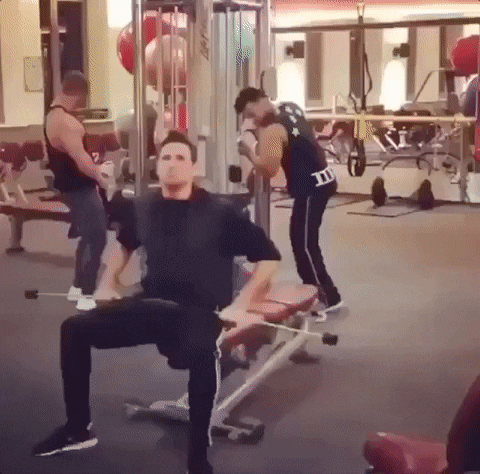

In [117]:
kmeans.fit(X_train)

KMeans(n_clusters=2, random_state=42)

And we predict the results of **X_test**, saving them in **y_pred**.

In [118]:
y_pred = kmeans.predict(X_test)

According to the documentation of scikit-learn, this method predicts the nearest cluster centroid for each point in **X**.

In [119]:
print("Accuracy score:", accuracy_score(y_test, y_pred))

Accuracy score: 0.9822222222222222


Let's take a look at the confusion matrix.

In [120]:
confusion(y_pred,y_test)

,Nombre de valeur prédites égale à 0,Nombre de valeur prédites égale à 1
Test est égale à 0,153,0
Test est égale à 1,8,289


By looking at the confusion matrix, we can see that out of a total of 450 observations in the test set:

- 153 were correctly predicted as actually belonging to class 0, and
- 289 observations were correctly predicted as belonging to class 1.

However, there were prediction errors:
- 8 observations that belonged to class 1 were incorrectly predicted as belonging to class 0, and
- no observations from class 0 were incorrectly predicted as belonging to class 1.

Using this confusion matrix, we can calculate various metrics to evaluate the model's performance, such as accuracy, recall, F1-score, and more.

In [121]:
print("Classification report:\n", classification_report(y_test, y_pred))

Classification report:
               precision    recall  f1-score   support

       False       1.00      0.95      0.97       161
        True       0.97      1.00      0.99       289

    accuracy                           0.98       450
   macro avg       0.99      0.98      0.98       450
weighted avg       0.98      0.98      0.98       450



We can see that the model has a precision of 1.00 for the "False" (0) class and a precision of 0.97 for the "True" (1) class. This means that all predictions for the "False" class are correct, while 3% of predictions for the "True" class are incorrect.

The recall is 0.95 for the "False" class and 1.00 for the "True" class. This means that the model correctly identified 95% of observations belonging to the "False" class and 100% of observations belonging to the "True" class.

The F1-score is a combined measure of precision and recall, and the model achieves a score of 0.97 for the "False" class and a score of 0.99 for the "True" class.

Finally, the overall accuracy of the model is 0.98, which means that 98% of predictions are correct for the entire test set.

The classification report thus allows us to assess the model's performance for each class and provides an overall assessment of the model's accuracy.

# Critiques of the KMeans-Based Model

One of the criticisms that could be expressed against the KMeans-based model is that the model is not necessarily designed for use in class prediction problems.

Furthermore, we've seen that for this algorithm, we needed to use the parameter **random_state=42**. We've seen that the purpose of using this parameter is to make the algorithm deterministic (ensuring that the initialization of clusters is always the same).

However, even if we use **random_state=42** to initialize the random number sequences used by the KMeans algorithm, the initial cluster centers will still be randomly chosen during the first run of the algorithm.

As we can see below by removing the **random_state=42** parameter.

In [122]:
for i in range(10):
    kmeans = KMeans(n_clusters=2)
    kmeans.fit(X_train)
    y_pred = kmeans.predict(X_test)
    print(f"Itération n° {i}: accuracy score = {accuracy_score(y_test, y_pred)}")

Itération n° 0: accuracy score = 0.017777777777777778
Itération n° 1: accuracy score = 0.017777777777777778
Itération n° 2: accuracy score = 0.017777777777777778
Itération n° 3: accuracy score = 0.9822222222222222
Itération n° 4: accuracy score = 0.017777777777777778
Itération n° 5: accuracy score = 0.017777777777777778
Itération n° 6: accuracy score = 0.9822222222222222
Itération n° 7: accuracy score = 0.017777777777777778
Itération n° 8: accuracy score = 0.017777777777777778
Itération n° 9: accuracy score = 0.017777777777777778


By creating a for loop that allows us to reset the predictions 10 times and provide an accuracy score each time, we can see that this accuracy score varies significantly!

These iterations illustrate the initial choice of cluster centers, which is randomly chosen.

Of course, the cluster centers will converge to the same position on each subsequent run with the same parameters and data, ensuring result reproducibility.

However, the results can be poor (1.8% correct predictions for some iterations), and in such cases, what should we do? Should we rerun the algorithm until the accuracy score is satisfactory? In the example above, we see several iterations before the results become acceptable.

Is this the case with the logistic regression-based algorithm as well?

In [123]:
for i in range(10):
    lr = LogisticRegression()
    lr.fit(X_train, y_train)
    y_pred = lr.predict(X_test)
    print(f"Itération n° {i}: accuracy score = {accuracy_score(y_test, y_pred)}")

Itération n° 0: accuracy score = 0.9866666666666667
Itération n° 1: accuracy score = 0.9866666666666667
Itération n° 2: accuracy score = 0.9866666666666667
Itération n° 3: accuracy score = 0.9866666666666667
Itération n° 4: accuracy score = 0.9866666666666667
Itération n° 5: accuracy score = 0.9866666666666667
Itération n° 6: accuracy score = 0.9866666666666667
Itération n° 7: accuracy score = 0.9866666666666667
Itération n° 8: accuracy score = 0.9866666666666667
Itération n° 9: accuracy score = 0.9866666666666667


Here we can see that we don't have this problem. The accuracy_score remains the same in each iteration, making things much simpler.